In [41]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
df = pd.read_csv('/content/drive/MyDrive/ML_Datasets/WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv')
df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [7]:
df.shape

(9134, 24)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

In [9]:
df.dtypes.value_counts()

object     16
int64       6
float64     2
dtype: int64

In [10]:
df1 = df.copy(deep = True)
df['Customer Lifetime Value'].describe()

count     9134.000000
mean      8004.940475
std       6870.967608
min       1898.007675
25%       3994.251794
50%       5780.182197
75%       8962.167041
max      83325.381190
Name: Customer Lifetime Value, dtype: float64

<ipython-input-11-97fa76ae070e>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['Customer Lifetime Value'],fit=norm)


mu = 8004.94 and sigma = 6870.59


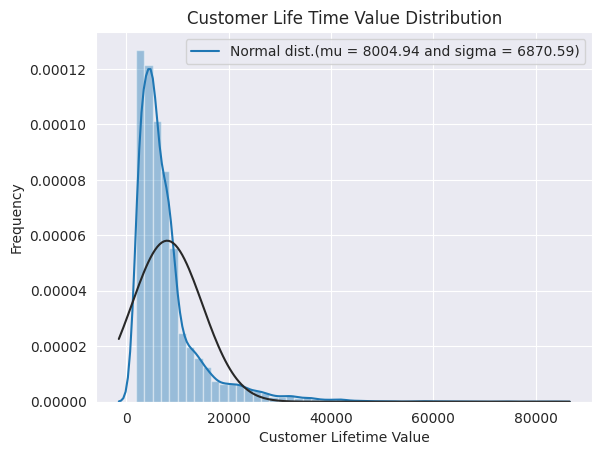

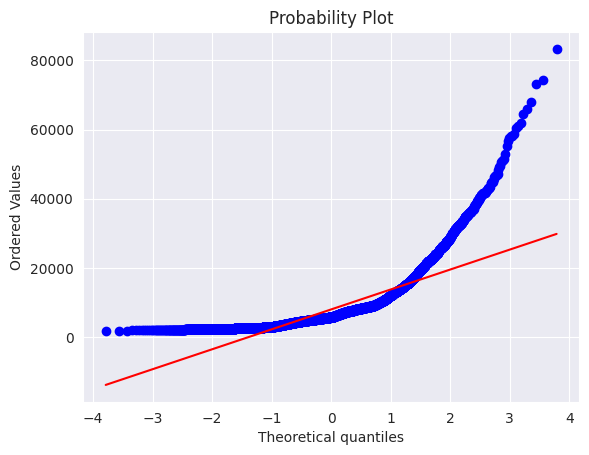

In [11]:
from scipy import stats
from scipy.stats import norm,skew

sns.distplot(df1['Customer Lifetime Value'],fit=norm)

(mu,sigma) = norm.fit(df1['Customer Lifetime Value'])
print('mu = {:.2f} and sigma = {:.2f}'.format(mu,sigma))

plt.legend(['Normal dist.(mu = {:.2f} and sigma = {:.2f})'.format(mu,sigma)],loc = 'best')
plt.ylabel('Frequency')
plt.title('Customer Life Time Value Distribution')

## Q-Q PLOT
fig = plt.figure()
res = stats.probplot(df1['Customer Lifetime Value'],plot = plt)
plt.show()

<ipython-input-12-4a7f9dab823a>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['Customer Lifetime Value'],fit=norm)


mu = 8.75 and sigma = 0.65


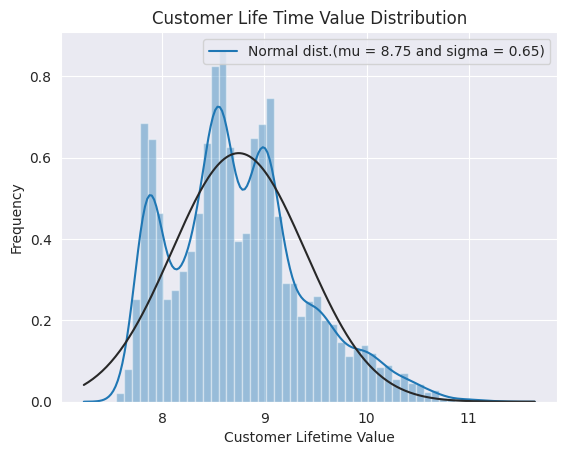

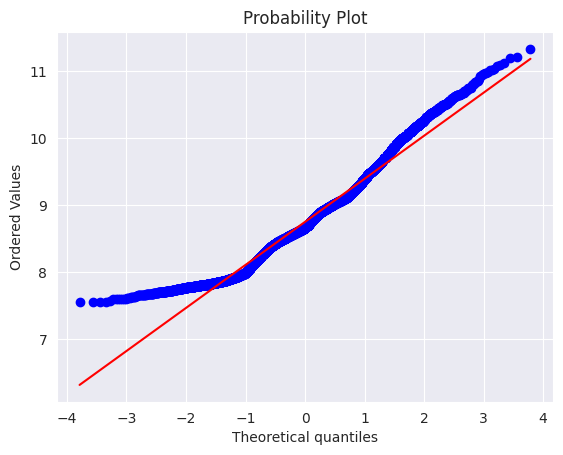

In [12]:
df1['Customer Lifetime Value'] = np.log1p(df1['Customer Lifetime Value'])
sns.distplot(df1['Customer Lifetime Value'],fit=norm)

(mu,sigma) = norm.fit(df1['Customer Lifetime Value'])
print('mu = {:.2f} and sigma = {:.2f}'.format(mu,sigma))

plt.legend(['Normal dist.(mu = {:.2f} and sigma = {:.2f})'.format(mu,sigma)],loc = 'best')
plt.ylabel('Frequency')
plt.title('Customer Life Time Value Distribution')

## Q-Q PLOT
fig = plt.figure()
res = stats.probplot(df1['Customer Lifetime Value'],plot = plt)
plt.show()

In [13]:
print('skewness before transformation:',df['Customer Lifetime Value'].skew())
print('skewness after transformation:',df1['Customer Lifetime Value'].skew())

skewness before transformation: 3.0322802599299847
skewness after transformation: 0.5761717967456804


In [14]:
df1 = df1.drop(['Customer','Customer Lifetime Value','Effective To Date'],axis = 1)
df_cat1 = df1.select_dtypes(include = ['object'])
df_cat1.columns

Index(['State', 'Response', 'Coverage', 'Education', 'EmploymentStatus',
       'Gender', 'Location Code', 'Marital Status', 'Policy Type', 'Policy',
       'Renew Offer Type', 'Sales Channel', 'Vehicle Class', 'Vehicle Size'],
      dtype='object')

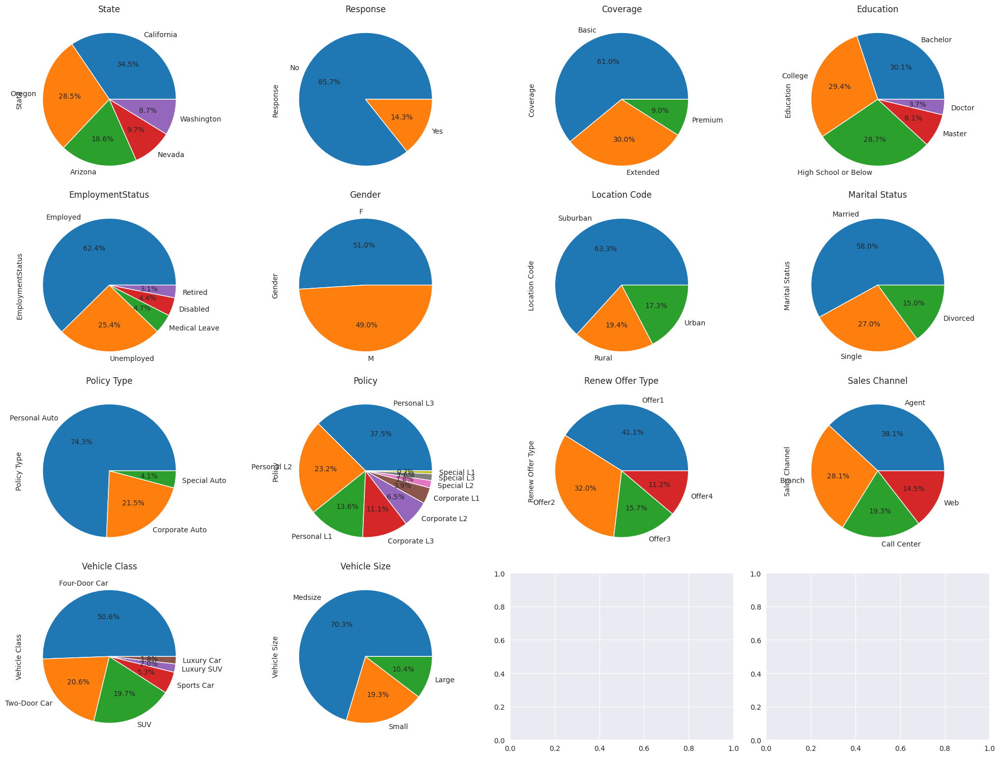

In [15]:
fig, axes = plt.subplots(round(len(df_cat1.columns) / 4), 4, figsize=(20, 15))

for i, ax in enumerate(fig.axes):
    if i < len(df_cat1.columns):
        df[df_cat1.columns[i]].value_counts().plot.pie(autopct = '%1.1f%%',ax = ax)
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_title(df_cat1.columns[i])

fig.tight_layout()

<ipython-input-16-bcebd308b4df>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-16-bcebd308b4df>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-16-bcebd308b4df>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-16-bcebd308b4df>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-16-bcebd308b4df>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-16-bcebd308b4df>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_x

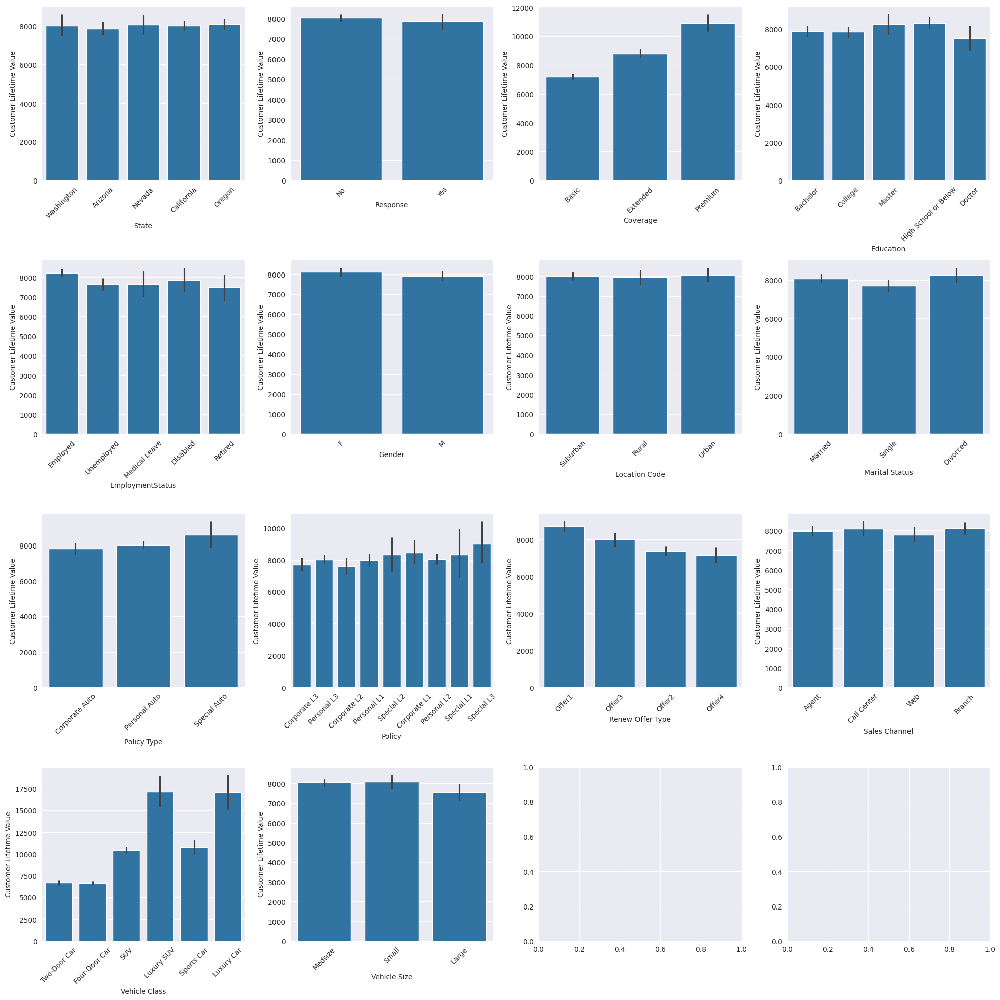

In [16]:
fig, axes = plt.subplots(round(len(df_cat1.columns) / 4), 4, figsize=(20, 20))

for i, ax in enumerate(fig.axes):
    if i < len(df_cat1.columns):
        sns.barplot(x = df[df_cat1.columns[i]],y = df['Customer Lifetime Value'],data = df, ax = ax )
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)

fig.tight_layout()

In [17]:
df_num = df.select_dtypes(include=['int64','float'])
df_num.columns

Index(['Customer Lifetime Value', 'Income', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies',
       'Total Claim Amount'],
      dtype='object')

In [18]:
df_num_corr = df_num.corr()['Customer Lifetime Value'].sort_values(ascending=False)
df_num_corr

Customer Lifetime Value          1.000000
Monthly Premium Auto             0.396262
Total Claim Amount               0.226451
Income                           0.024366
Number of Policies               0.021955
Months Since Last Claim          0.011517
Months Since Policy Inception    0.009418
Number of Open Complaints       -0.036343
Name: Customer Lifetime Value, dtype: float64

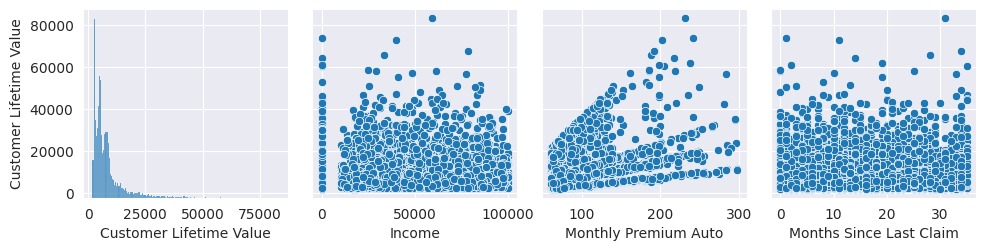

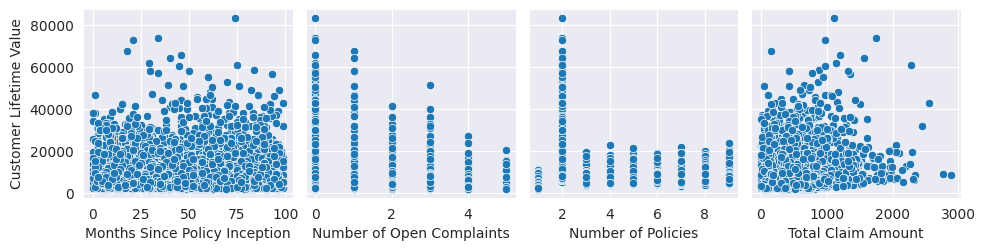

In [19]:
for i in range(0, len(df_num.columns), 4):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+4],
                y_vars=['Customer Lifetime Value'])

<Axes: >

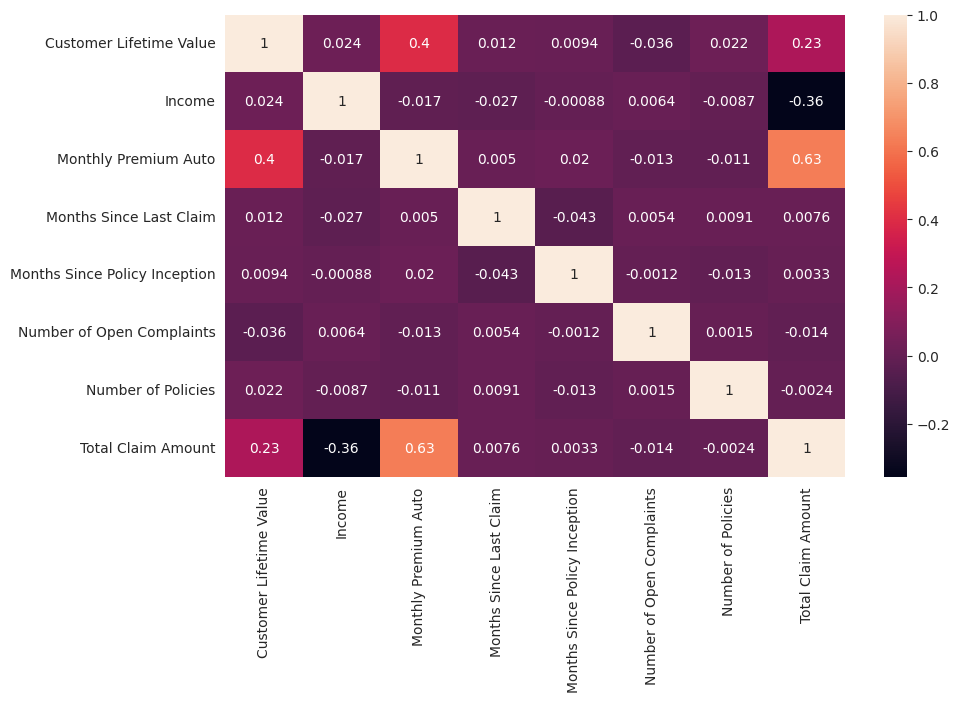

In [20]:
plt.figure(figsize=(10,6))
sns.heatmap(df_num.corr(),annot = True)

In [21]:
y = df['Customer Lifetime Value']
df1.head()

,State,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,Washington,No,Basic,Bachelor,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,Arizona,No,Extended,Bachelor,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,Nevada,No,Premium,Bachelor,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,California,No,Basic,Bachelor,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,Washington,No,Basic,Bachelor,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [22]:
df1 = pd.get_dummies(df1,drop_first=True)
df1.shape

(9134, 50)

In [23]:
num_features = df.dtypes[df.dtypes != 'object'].index
skewed_feat = df[num_features].apply(lambda x: x.skew()).sort_values(ascending = False)
skewness = pd.DataFrame(skewed_feat,columns = ['skew'])
skewness

,skew
Customer Lifetime Value,3.032280
Number of Open Complaints,2.783263
Monthly Premium Auto,2.123546
Total Claim Amount,1.714966
Number of Policies,1.253333
Income,0.286887
Months Since Last Claim,0.278586
Months Since Policy Inception,0.040165


In [24]:
from scipy.special import boxcox1p
skewness_feat = ['Monthly Premium Auto','Total Claim Amount']
lam = 0.15
for i in skewness_feat:
    df1[i] = boxcox1p(df1[i],lam)

In [25]:
import statsmodels.api as sm
Xc = sm.add_constant(df1)
model = sm.OLS(y,Xc).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     Customer Lifetime Value   R-squared:                       0.170
Model:                                 OLS   Adj. R-squared:                  0.166
Method:                      Least Squares   F-statistic:                     38.85
Date:                     Fri, 29 Mar 2024   Prob (F-statistic):               0.00
Time:                             13:51:36   Log-Likelihood:                -92807.
No. Observations:                     9134   AIC:                         1.857e+05
Df Residuals:                         9085   BIC:                         1.861e+05
Df Model:                               48                                         
Covariance Type:                 nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                          -1.777e+04   3201.327     -5.550      0.000    -2.4e+04   -1.15e+04
Income                            -0.0016      0.004     -0.420      0.674      -0.009       0.006
Monthly Premium Auto            3958.6659    540.617      7.322      0.000    2898.934    5018.397
Months Since Last Claim            7.5271      6.549      1.149      0.250      -5.310      20.364
Months Since Policy Inception     -1.3830      2.379     -0.581      0.561      -6.046       3.280
Number of Open Complaints       -262.4445     72.453     -3.622      0.000    -404.469    -120.420
Number of Policies                55.5714     27.743      2.003      0.045       1.190     109.953
Total Claim Amount                88.8594     76.812      1.157      0.247     -61.710     239.429
State_California                  30.3018    189.330      0.160      0.873    -340.827     401.430
State_Nevada                      23.8488    261.033      0.091      0.927    -487.835     535.532
State_Oregon                      91.0956    195.944      0.465      0.642    -292.999     475.190
State_Washington                 182.9220    269.817      0.678      0.498    -345.980     711.824
Response_Yes                    -179.7431    207.128     -0.868      0.386    -585.761     226.275
Coverage_Extended               -284.1983    281.746     -1.009      0.313    -836.484     268.087
Coverage_Premium                -371.4872    544.803     -0.682      0.495   -1439.424     696.450
Education_College                 -9.0076    171.144     -0.053      0.958    -344.488     326.473
Education_Doctor                -167.2398    362.753     -0.461      0.645    -878.317     543.837
Education_High School or Below   367.0768    173.235      2.119      0.034      27.498     706.656
Education_Master                 156.6972    262.718      0.596      0.551    -358.289     671.683
EmploymentStatus_Employed        708.3178    354.255      1.999      0.046      13.899    1402.737
EmploymentStatus_Medical Leave   173.8684    435.917      0.399      0.690    -680.627    1028.363
EmploymentStatus_Retired          93.1548    502.482      0.185      0.853    -891.822    1078.132
EmploymentStatus_Unemployed      -56.9328    356.783     -0.160      0.873    -756.308     642.443
Gender_M                        -168.8049    132.832     -1.271      0.204    -429.186      91.577
Location Code_Suburban          -487.0965    345.427     -1.410      0.159   -1164.212     190.019
Location Code_Urban             -167.4939    305.340     -0.549      0.583    -766.029     431.041
Marital Status_Married          -181.6439    194.638     -0.933      0.351    -563.177     199.890
Marital Status_Single           -531.4468    224.505     -

In [26]:
y_transformed = np.log1p(y)
model2 = sm.OLS(y_transformed,Xc).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     Customer Lifetime Value   R-squared:                       0.269
Model:                                 OLS   Adj. R-squared:                  0.265
Method:                      Least Squares   F-statistic:                     69.58
Date:                     Fri, 29 Mar 2024   Prob (F-statistic):               0.00
Time:                             13:51:55   Log-Likelihood:                -7635.1
No. Observations:                     9134   AIC:                         1.537e+04
Df Residuals:                         9085   BIC:                         1.572e+04
Df Model:                               48                                         
Covariance Type:                 nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                              5.1082      0.286     17.890      0.000       4.548       5.668
Income                           2.17e-07   3.44e-07      0.631      0.528   -4.58e-07    8.91e-07
Monthly Premium Auto               0.5500      0.048     11.407      0.000       0.456       0.645
Months Since Last Claim            0.0005      0.001      0.865      0.387      -0.001       0.002
Months Since Policy Inception     -0.0003      0.000     -1.484      0.138      -0.001       0.000
Number of Open Complaints         -0.0315      0.006     -4.876      0.000      -0.044      -0.019
Number of Policies                 0.0526      0.002     21.258      0.000       0.048       0.057
Total Claim Amount                 0.0070      0.007      1.019      0.308      -0.006       0.020
State_California                   0.0103      0.017      0.607      0.544      -0.023       0.043
State_Nevada                       0.0035      0.023      0.150      0.880      -0.042       0.049
State_Oregon                       0.0139      0.017      0.798      0.425      -0.020       0.048
State_Washington                  -0.0043      0.024     -0.179      0.858      -0.051       0.043
Response_Yes                      -0.0092      0.018     -0.496      0.620      -0.045       0.027
Coverage_Extended                 -0.0396      0.025     -1.577      0.115      -0.089       0.010
Coverage_Premium                  -0.0863      0.049     -1.776      0.076      -0.182       0.009
Education_College                  0.0058      0.015      0.377      0.706      -0.024       0.036
Education_Doctor                  -0.0269      0.032     -0.832      0.406      -0.090       0.037
Education_High School or Below     0.0378      0.015      2.448      0.014       0.008       0.068
Education_Master                   0.0168      0.023      0.715      0.475      -0.029       0.063
EmploymentStatus_Employed          0.0576      0.032      1.823      0.068      -0.004       0.120
EmploymentStatus_Medical Leave    -0.0108      0.039     -0.278      0.781      -0.087       0.065
EmploymentStatus_Retired        3.587e-05      0.045      0.001      0.999      -0.088       0.088
EmploymentStatus_Unemployed       -0.0208      0.032     -0.655      0.512      -0.083       0.042
Gender_M                          -0.0120      0.012     -1.013      0.311      -0.035       0.011
Location Code_Suburban            -0.0446      0.031     -1.447      0.148      -0.105       0.016
Location Code_Urban               -0.0149      0.027     -0.548      0.584      -0.068       0.038
Marital Status_Married            -0.0068      0.017     -0.393      0.695      -0.041       0.027
Marital Status_Single             -0.0547      0.020     -

In [27]:
X_up = df1[['Total Claim Amount','Monthly Premium Auto']]
from sklearn.preprocessing import PolynomialFeatures
qr = PolynomialFeatures(degree = 3)
x_qr = qr.fit_transform(X_up)
x_main = pd.DataFrame(x_qr)
x_main.head()

,0,1,2,3,4,5,6,7,8,9
0,1.0,9.621228,5.942124,92.568032,57.170534,35.308842,890.618152,550.050755,339.714424,209.809530
1,1.0,12.476442,6.533131,155.661595,81.510230,42.681804,1942.102798,1016.957627,532.517031,278.845825
2,1.0,10.591730,6.808145,112.184735,72.110034,46.350843,1188.230367,763.769981,490.935596,315.563279
3,1.0,10.420040,6.770766,108.577231,70.551654,45.843275,1131.379075,735.151045,477.688753,310.394097
4,1.0,7.310601,6.047664,53.444881,44.212056,36.574239,390.714183,323.216680,267.379652,221.188703


In [28]:
df2= pd.concat([df1,x_main.iloc[:,3:]],axis = 1)
df2.head()

,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount,State_California,State_Nevada,State_Oregon,State_Washington,Response_Yes,Coverage_Extended,Coverage_Premium,Education_College,Education_Doctor,Education_High School or Below,Education_Master,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Gender_M,Location Code_Suburban,Location Code_Urban,Marital Status_Married,Marital Status_Single,Policy Type_Personal Auto,Policy Type_Special Auto,Policy_Corporate L2,Policy_Corporate L3,Policy_Personal L1,Policy_Personal L2,Policy_Personal L3,Policy_Special L1,Policy_Special L2,Policy_Special L3,Renew Offer Type_Offer2,Renew Offer Type_Offer3,Renew Offer Type_Offer4,Sales Channel_Branch,Sales Channel_Call Center,Sales Channel_Web,Vehicle Class_Luxury Car,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,Vehicle Size_Medsize,Vehicle Size_Small,3,4,5,6,7,8,9
0,56274,5.942124,32,5,0,1,9.621228,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,92.568032,57.170534,35.308842,890.618152,550.050755,339.714424,209.809530
1,0,6.533131,13,42,0,8,12.476442,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,155.661595,81.510230,42.681804,1942.102798,1016.957627,532.517031,278.845825
2,48767,6.808145,18,38,0,2,10.591730,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,112.184735,72.110034,46.350843,1188.230367,763.769981,490.935596,315.563279
3,0,6.770766,18,65,0,7,10.420040,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,108.577231,70.551654,45.843275,1131.379075,735.151045,477.688753,310.394097
4,43836,6.047664,12,44,0,1,7.310601,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,53.444881,44.212056,36.574239,390.714183,323.216680,267.379652,221.188703


In [29]:
Xc = sm.add_constant(df2)
model3 = sm.OLS(y_transformed,Xc).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     Customer Lifetime Value   R-squared:                       0.270
Model:                                 OLS   Adj. R-squared:                  0.266
Method:                      Least Squares   F-statistic:                     61.04
Date:                     Fri, 29 Mar 2024   Prob (F-statistic):               0.00
Time:                             13:52:25   Log-Likelihood:                -7627.7
No. Observations:                     9134   AIC:                         1.537e+04
Df Residuals:                         9078   BIC:                         1.577e+04
Df Model:                               55                                         
Covariance Type:                 nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -2.2687      5.437     -0.417      0.676     -12.926       8.388
Income                          1.926e-07   3.44e-07      0.559      0.576   -4.83e-07    8.68e-07
Monthly Premium Auto               3.2337      2.437      1.327      0.185      -1.543       8.011
Months Since Last Claim            0.0006      0.001      0.951      0.342      -0.001       0.002
Months Since Policy Inception     -0.0003      0.000     -1.467      0.142      -0.001       0.000
Number of Open Complaints         -0.0314      0.006     -4.853      0.000      -0.044      -0.019
Number of Policies                 0.0525      0.002     21.228      0.000       0.048       0.057
Total Claim Amount                 0.1831      0.315      0.582      0.560      -0.433       0.800
State_California                   0.0102      0.017      0.606      0.545      -0.023       0.043
State_Nevada                       0.0023      0.023      0.098      0.922      -0.043       0.048
State_Oregon                       0.0144      0.017      0.825      0.410      -0.020       0.049
State_Washington                  -0.0034      0.024     -0.142      0.887      -0.051       0.044
Response_Yes                      -0.0104      0.019     -0.563      0.574      -0.047       0.026
Coverage_Extended                 -0.0316      0.025     -1.246      0.213      -0.081       0.018
Coverage_Premium                  -0.0290      0.052     -0.557      0.577      -0.131       0.073
Education_College                  0.0052      0.015      0.338      0.735      -0.025       0.035
Education_Doctor                  -0.0251      0.032     -0.775      0.438      -0.089       0.038
Education_High School or Below     0.0368      0.015      2.378      0.017       0.006       0.067
Education_Master                   0.0168      0.023      0.717      0.474      -0.029       0.063
EmploymentStatus_Employed          0.0562      0.032      1.778      0.075      -0.006       0.118
EmploymentStatus_Medical Leave    -0.0115      0.039     -0.297      0.766      -0.088       0.065
EmploymentStatus_Retired          -0.0015      0.045     -0.033      0.974      -0.089       0.086
EmploymentStatus_Unemployed       -0.0212      0.032     -0.664      0.507      -0.084       0.041
Gender_M                          -0.0127      0.012     -1.075      0.283      -0.036       0.010
Location Code_Suburban            -0.0561      0.039     -1.439      0.150      -0.133       0.020
Location Code_Urban               -0.0270      0.033     -0.816      0.414      -0.092       0.038
Marital Status_Married            -0.0078      0.017     -0.452      0.652      -0.042       0.026
Marital Status_Single             -0.0534      0.020     -

In [30]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(df1,y_transformed,test_size = 0.3,random_state=4)

In [31]:
from sklearn.linear_model import Lasso,ElasticNet,LassoLarsIC,BayesianRidge
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,BaggingRegressor,AdaBoostRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.base import BaseEstimator,TransformerMixin,RegressorMixin,clone
from sklearn.model_selection import KFold,cross_val_score,train_test_split
from sklearn.metrics import mean_squared_error,r2_score
import xgboost as xgb
import lightgbm as lgb
from sklearn.svm import SVR

In [32]:
dt = DecisionTreeRegressor()
dt_tuned = DecisionTreeRegressor(max_depth =  8, min_samples_leaf =  18, min_samples_split = 22)
dt_bag = BaggingRegressor(base_estimator=dt_tuned,n_estimators=10,random_state=0)
dt_boost = AdaBoostRegressor(base_estimator=dt_tuned,n_estimators=50,random_state=0)

In [34]:
for model,name in zip([dt,dt_tuned,dt_bag,dt_boost],['decision_tree','dt_tuned','dt_bag','dt_boost']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)
    print('*'*60)

model: decision_tree
train r2: 1.0
test r2: 0.8193338229089165
Mape: 1.221338331378178
Adjusted R squared score is : 0.8159757155280414
************************************************************
model: dt_tuned
train r2: 0.9115762293682189
test r2: 0.8971375979823305
Mape: 1.1453877206442966
Adjusted R squared score is : 0.8952256574243812
************************************************************
model: dt_bag


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


train r2: 0.9151751401839358
test r2: 0.9014122984401167
Mape: 1.130806223586818
Adjusted R squared score is : 0.8995798132810111
************************************************************
model: dt_boost


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


train r2: 0.9182209507008972
test r2: 0.8911816393117061
Mape: 1.3804705546973022
Adjusted R squared score is : 0.8891589932022583
************************************************************


In [35]:
X_imp=pd.DataFrame(dt_tuned.feature_importances_,columns=['Imp'],index=x_test.columns)
X_imp=X_imp.sort_values(by='Imp',ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names',fontsize=80)
plt.xticks(rotation=90,fontsize=150)
sns.barplot(x=X_imp.index,y=X_imp['Imp'])
X_imp.T

,Number of Policies,Monthly Premium Auto,Coverage_Extended,Income,EmploymentStatus_Employed,Total Claim Amount,Months Since Last Claim,Response_Yes,Number of Open Complaints,Gender_M,Coverage_Premium,Months Since Policy Inception,Education_Master,Marital Status_Single,Education_High School or Below,Education_College,Marital Status_Married,EmploymentStatus_Unemployed,Education_Doctor,Sales Channel_Web,Policy_Special L3,Renew Offer Type_Offer2,Renew Offer Type_Offer3,Renew Offer Type_Offer4,Sales Channel_Branch,Sales Channel_Call Center,Vehicle Class_Luxury Car,Policy_Special L1,Vehicle Class_Luxury SUV,Vehicle Class_SUV,Vehicle Class_Sports Car,Vehicle Class_Two-Door Car,Vehicle Size_Medsize,Policy_Special L2,Policy_Personal L3,State_Washington,Policy_Personal L2,Policy_Personal L1,Policy_Corporate L3,Policy_Corporate L2,Policy Type_Special Auto,Policy Type_Personal Auto,State_California,State_Nevada,Location Code_Urban,Location Code_Suburban,State_Oregon,EmploymentStatus_Retired,EmploymentStatus_Medical Leave,Vehicle Size_Small
Imp,0.739868,0.228167,0.014227,0.005187,0.002795,0.00225,0.001727,0.001182,0.001042,0.000773,0.000639,0.000623,0.000606,0.000316,0.000309,0.000181,0.0001,0.000009,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
rf = RandomForestRegressor()
rf_tuned = RandomForestRegressor(max_depth =  36,max_features = 25,min_samples_leaf = 2,min_samples_split = 7,n_estimators=432)

In [37]:
for model,name in zip([rf,rf_tuned],['Random Forest','Random Forest Tuned']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)
    print('*'*60)

model: Random Forest
train r2: 0.9874075596262095
test r2: 0.9102148900538922
Mape: 0.9813294358064267
Adjusted R squared score is : 0.9085460218392806
************************************************************
model: Random Forest Tuned
train r2: 0.9710465273298254
test r2: 0.9119618058954919
Mape: 0.98818455851539
Adjusted R squared score is : 0.9103254082355569
************************************************************


In [38]:
X_imp=pd.DataFrame(rf_tuned.feature_importances_,columns=['Imp'],index=x_test.columns)
X_imp=X_imp.sort_values(by='Imp',ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names',fontsize=80)
plt.xticks(rotation=90,fontsize=150)
sns.barplot(x=X_imp.index,y=X_imp['Imp'])
X_imp.T

,Number of Policies,Monthly Premium Auto,Total Claim Amount,Vehicle Class_SUV,Income,Months Since Last Claim,Months Since Policy Inception,Coverage_Extended,Vehicle Class_Luxury SUV,Vehicle Class_Luxury Car,Coverage_Premium,Number of Open Complaints,EmploymentStatus_Employed,Gender_M,Response_Yes,Vehicle Class_Sports Car,Marital Status_Single,Marital Status_Married,Education_College,EmploymentStatus_Unemployed,Renew Offer Type_Offer2,Location Code_Suburban,Education_High School or Below,Sales Channel_Branch,Vehicle Class_Two-Door Car,Sales Channel_Call Center,Renew Offer Type_Offer3,State_California,State_Nevada,Policy_Personal L3,Vehicle Size_Medsize,Education_Master,Location Code_Urban,Policy Type_Personal Auto,State_Oregon,Renew Offer Type_Offer4,EmploymentStatus_Medical Leave,Vehicle Size_Small,Policy_Personal L2,State_Washington,Sales Channel_Web,Policy_Personal L1,Policy_Corporate L3,EmploymentStatus_Retired,Policy Type_Special Auto,Policy_Corporate L2,Policy_Special L3,Policy_Special L2,Education_Doctor,Policy_Special L1
Imp,0.679971,0.18001,0.032623,0.01388,0.01148,0.009959,0.009852,0.007025,0.006542,0.004713,0.00378,0.002706,0.002607,0.001895,0.001684,0.001635,0.001617,0.001607,0.001499,0.001498,0.001441,0.001315,0.001246,0.001237,0.001104,0.001081,0.001007,0.000982,0.000981,0.00098,0.000968,0.000958,0.000893,0.000849,0.000838,0.000805,0.000787,0.00077,0.000752,0.000715,0.000661,0.000605,0.000591,0.000566,0.000328,0.000293,0.000292,0.000156,0.000146,0.000073


In [39]:
gboost = GradientBoostingRegressor(n_estimators=1000)

In [40]:
for model,name in zip([gboost],['Gradient Boost']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)

model: Gradient Boost
train r2: 0.9556863993272798
test r2: 0.9034415034531493
Mape: 1.2813917298633941
Adjusted R squared score is : 0.9016467358593417


**Random Forest is Performing best**